In [1]:
%reset -f

import os, sys
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import healpy as hp

import rubin_sim
import rubin_sim.maf as maf
import rubin_sim.utils as rsUtils
from rubin_sim.data import get_baseline
from rubin_sim.maf.utils import m52snr

from pyLIMA import microlsimulator
from pyLIMA import microlcaustics
from pyLIMA import microlmodels
from pyLIMA import telescopes

#from sim_custom_event_lightcurve import sim_event_lightcurve_with_timestamps

In [2]:
baseline_file = get_baseline()
name = os.path.basename(baseline_file).replace('.db','')
conn = maf.db.OpsimDatabase(baseline_file)
outDir = 'temp'
resultsDb = maf.db.ResultsDb(outDir=outDir)

print(baseline_file)

/home/anibal/rubin_sim_data/sim_baseline/baseline_v2.0_10yrs.db


In [3]:
bundleList = []
Ra,Dec = 270,-30
ra = [Ra]
dec = [Dec]
metric = maf.metrics.PassMetric(cols=['filter', 'observationStartMJD', 'fiveSigmaDepth'])
sql = ''
slicer = maf.slicers.UserPointsSlicer(ra=ra, dec=dec)
bundleList.append(maf.MetricBundle(metric, slicer, sql, runName=name))

In [4]:
bd = maf.metricBundles.makeBundlesDictFromList(bundleList)
bg = maf.metricBundles.MetricBundleGroup(bd, conn, outDir=outDir, resultsDb=resultsDb)
bg.runAll()

dataSlice = bundleList[0].metricValues[0]

Querying table None with no constraint for columns ['observationStartMJD', 'fieldDec', 'rotSkyPos', 'fieldRA', 'filter', 'fiveSigmaDepth'].
Found 2086980 visits
Running:  ['baseline_v2_0_10yrs_Pass_filter_observationStartMJD_fiveSigmaDepth_USER']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


In [5]:
'''
    define the array "lightcurve" [timestamps,mag,magerr] (ts) in each filter
'''

uv = np.where(dataSlice['filter'] == 'u')[0]
ts_uv = np.array(dataSlice['observationStartMJD'][uv])
ts_uv.sort()
ts_uv = np.array([ts_uv,np.ones(len(ts_uv))*15,np.ones(len(ts_uv))/10]).T

gv = np.where(dataSlice['filter'] == 'g')[0]
ts_gv = np.array(dataSlice['observationStartMJD'][gv])
ts_gv.sort()
ts_gv = np.array([ts_gv,np.ones(len(ts_gv))*15,np.ones(len(ts_gv))/20]).T

rv = np.where(dataSlice['filter'] == 'r')[0]
ts_rv = np.array(dataSlice['observationStartMJD'][rv])
ts_rv.sort()
ts_rv = np.array([ts_rv,np.ones(len(ts_rv))*15,np.ones(len(ts_rv))/30]).T

iv = np.where(dataSlice['filter'] == 'i')[0]
ts_iv = np.array(dataSlice['observationStartMJD'][iv])
ts_iv.sort()
ts_iv = np.array([ts_iv,np.ones(len(ts_iv))*15,np.ones(len(ts_iv))/30]).T

zv = np.where(dataSlice['filter'] == 'z')[0]
ts_zv = np.array(dataSlice['observationStartMJD'][zv])
ts_zv.sort()
ts_zv = np.array([ts_zv,np.ones(len(ts_zv))*15,np.ones(len(ts_zv))/30]).T

yv = np.where(dataSlice['filter'] == 'y')[0]
ts_yv = np.array(dataSlice['observationStartMJD'][yv])
ts_yv.sort()
ts_yv = np.array([ts_yv,np.ones(len(ts_yv))*15,np.ones(len(ts_yv))/30]).T

# read data from TRILEGAL

 http://stev.oapd.inaf.it/cgi-bin/trilegal
 
 ra = 270
 
 dec = -30
 
 filtros: LSST + WFIRST
 
 The zero point has been updated with the info here https://smtn-002.lsst.io/#useful-github-repositories
 
 
 

In [6]:
import pandas as pd
data = pd.read_csv('trilegal_wfirst_lsst.dat', sep="\s+", decimal ='.', header = [0])
data = data.drop([len(data['u'])-1])
data

,#Gc,logAge,[M/H],m_ini,logL,logTe,logg,m-M0,Av,m2/m1,...,z,Y,R062,Z087,Y106,J129,H158,F184,W149,Mact
0,1,6.65,-0.41,0.39951,-1.557,3.600,4.942,13.1,0.036,0.00,...,21.372,21.226,22.027,20.885,20.490,20.056,19.621,19.468,20.005,0.400
1,1,6.65,-0.35,0.14717,-1.660,3.522,4.299,14.1,0.038,0.00,...,22.662,22.432,23.951,22.180,21.629,21.144,20.747,20.594,21.126,0.147
2,1,6.65,-0.35,0.07664,-2.075,3.486,4.288,14.2,0.038,0.00,...,23.850,23.563,25.503,23.369,22.715,22.215,21.819,21.692,22.207,0.077
3,1,6.65,-0.33,0.11485,-1.815,3.511,4.305,13.6,0.037,0.80,...,21.966,21.713,23.395,21.484,20.893,20.402,20.007,19.864,20.389,0.115
4,1,6.65,-0.33,0.30157,-1.841,3.580,5.024,14.1,0.038,0.00,...,23.067,22.897,23.892,22.582,22.147,21.707,21.295,21.147,21.670,0.302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2514,1,6.95,0.41,0.02974,-2.650,3.410,4.147,12.8,0.035,0.00,...,24.207,23.627,26.730,23.687,22.657,22.143,21.801,21.649,22.157,0.030
2515,1,6.95,0.41,0.85118,-0.538,3.687,4.601,12.9,0.035,0.75,...,18.389,18.306,18.717,17.900,17.604,17.196,16.798,16.656,17.156,0.851
2516,1,6.95,0.41,0.12146,-1.842,3.485,4.250,13.2,0.036,0.00,...,22.272,21.949,24.007,21.789,21.099,20.614,20.245,20.115,20.614,0.121
2517,1,6.95,0.41,0.04034,-2.535,3.432,4.254,13.9,0.037,0.00,...,24.897,24.406,27.177,24.393,23.477,22.975,22.626,22.488,22.986,0.040


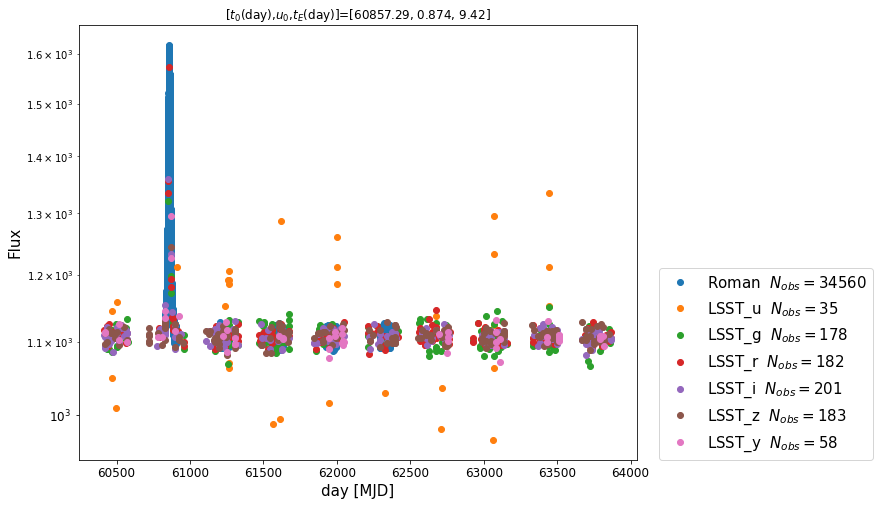

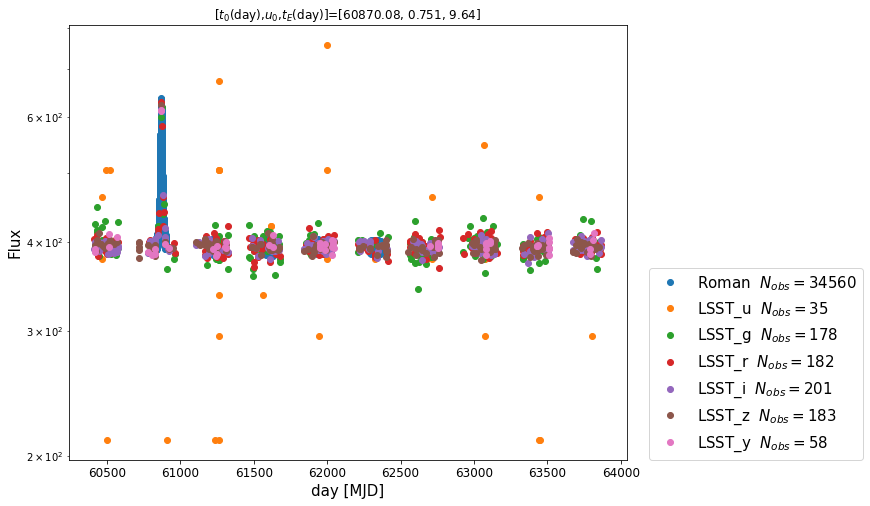

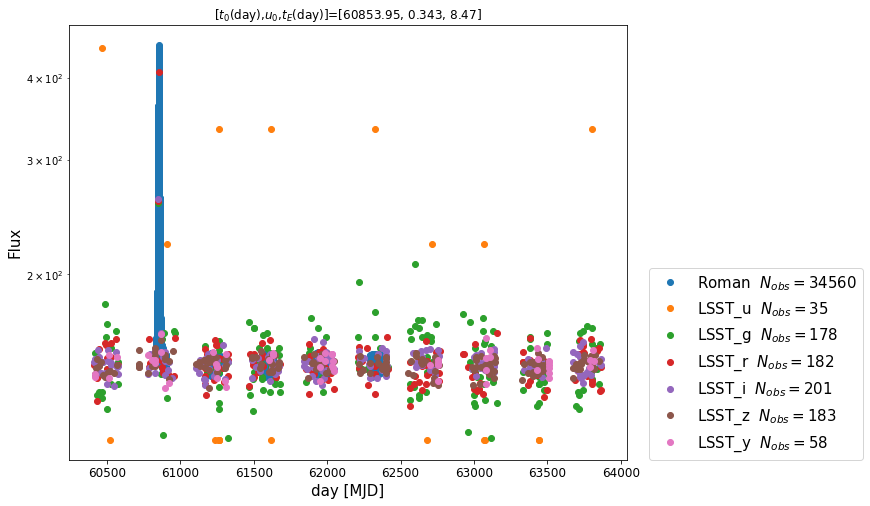

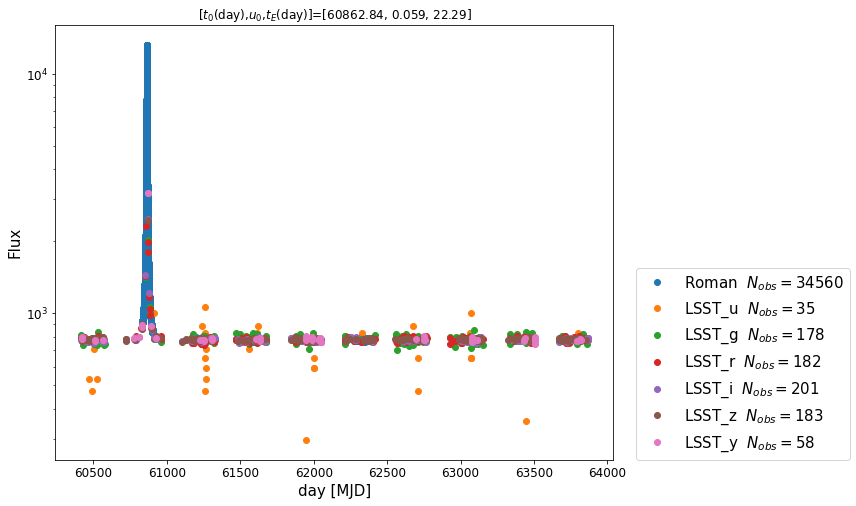

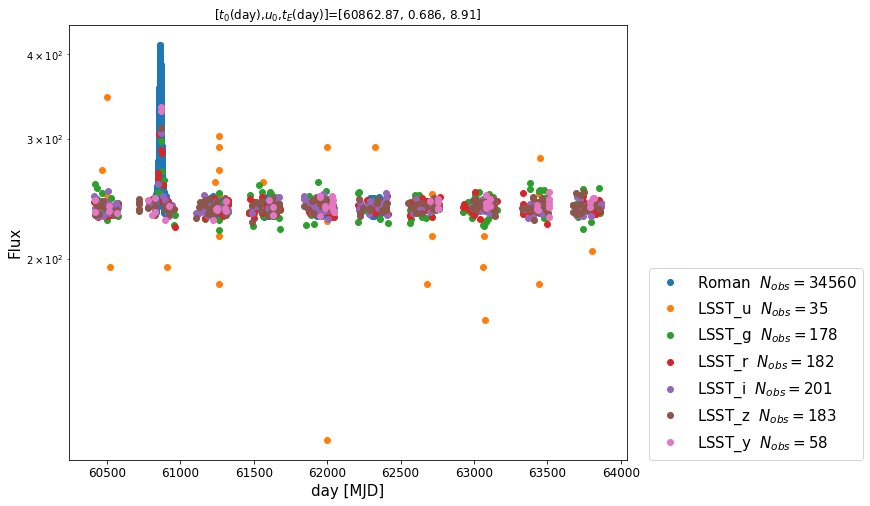

...

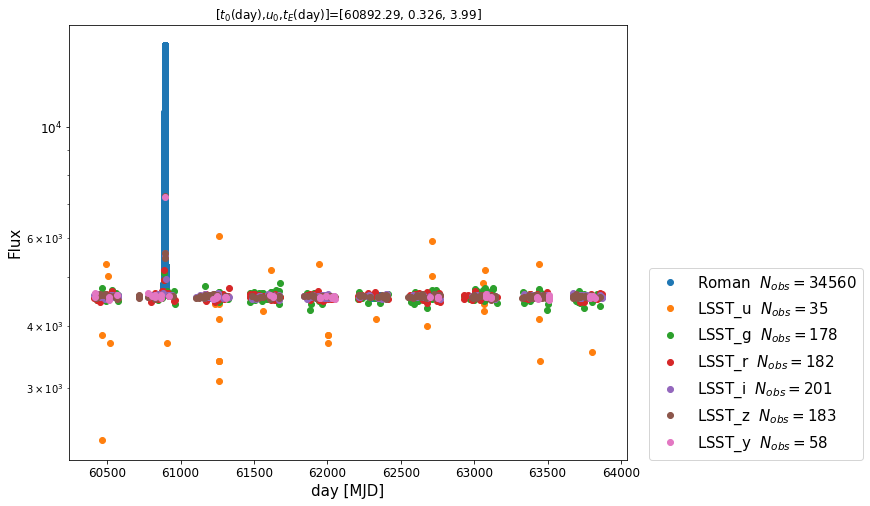

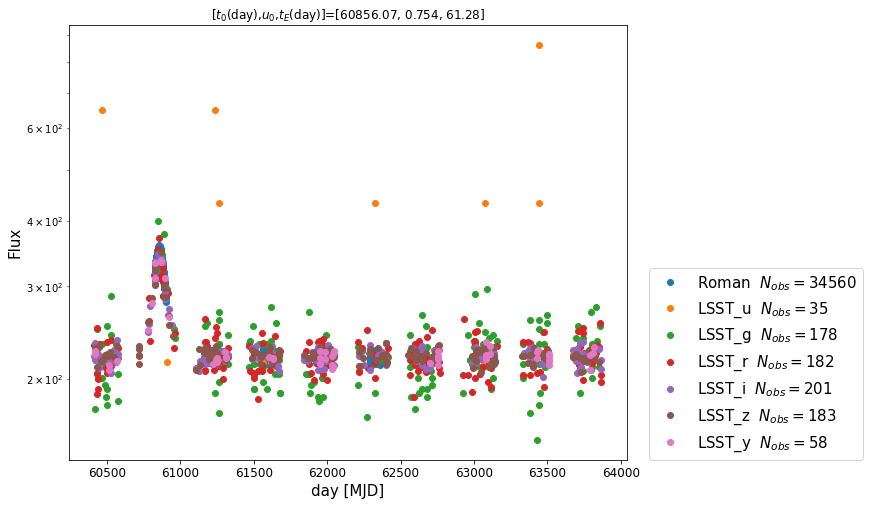

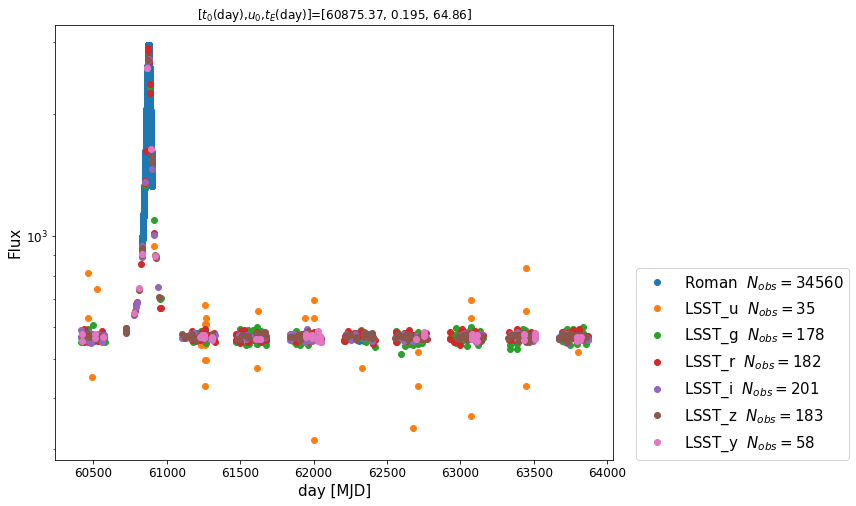

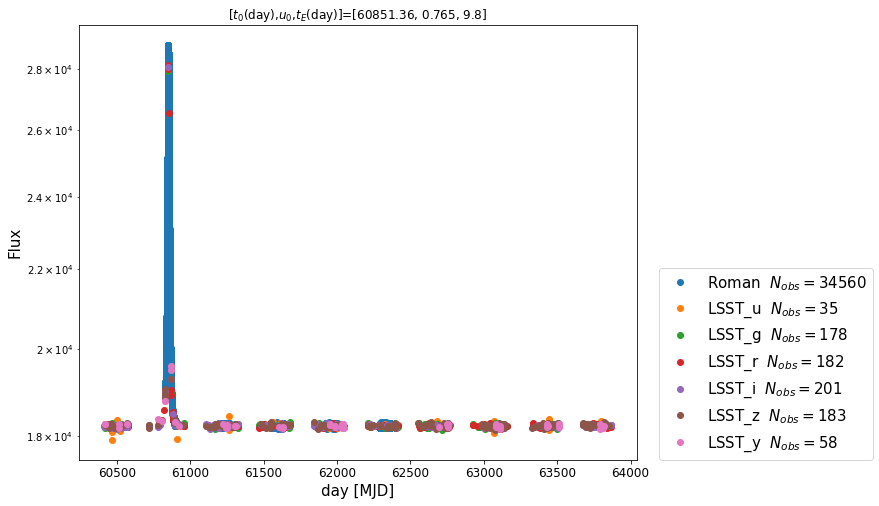

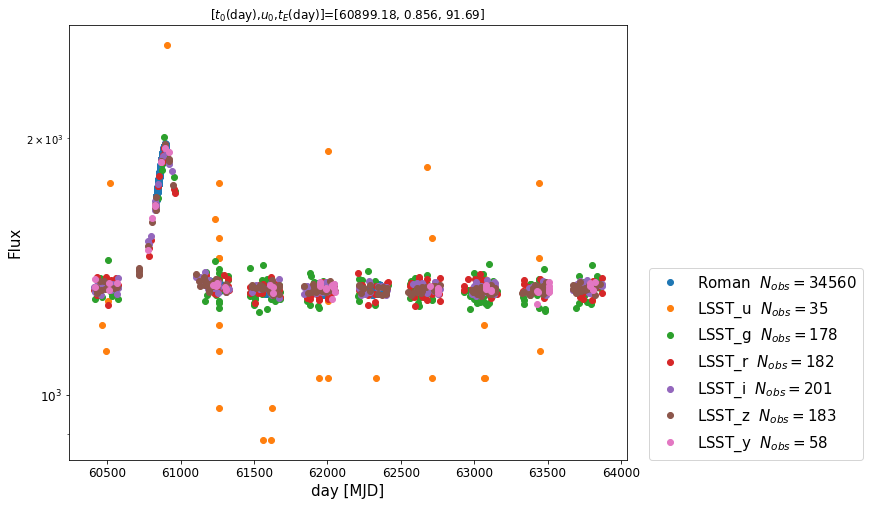

1655429247.082876


In [7]:
#Flux parameters, Roman, LSST_u, LSST_g .... Assuming ZP=25 for all LSST bands....
t0 = time.time()

for i in range(272):
    '''
Ettiene code
'''
    #ZP = 27.615
    tstart_Roman = 60465.148604034286+365
    tstart_LSST = tstart_Roman-2000
    my_own_creation = microlsimulator.simulate_a_microlensing_event(name ='An event observed by Roman', 
                                                                    ra=Ra, dec=Dec)
    #Create Roman observing seasons
    Roman1 = microlsimulator.simulate_a_telescope('Roman',my_own_creation, tstart_Roman,tstart_Roman+72,0.25, 'Space','W149',
                                                      uniform_sampling=True)

    Roman2 = microlsimulator.simulate_a_telescope('Roman',my_own_creation, tstart_Roman+365.25,tstart_Roman+72+365.25,0.25, 'Space','W149',
                                                      uniform_sampling=True)
    Roman3 = microlsimulator.simulate_a_telescope('Roman',my_own_creation, tstart_Roman+2*365.25,tstart_Roman+72+2*365.25,0.25, 'Space','W149',uniform_sampling=True)

    Roman4 = microlsimulator.simulate_a_telescope('Roman',my_own_creation, tstart_Roman+3*365.25,tstart_Roman+72+3*365.25,0.25, 'Space','W149',uniform_sampling=True)

    Roman5 = microlsimulator.simulate_a_telescope('Roman',my_own_creation, tstart_Roman+4*365.25,tstart_Roman+72+4*365.25,0.25, 'Space','W149',uniform_sampling=True)

    Roman_tot = microlsimulator.simulate_a_telescope('Roman',my_own_creation, tstart_Roman+2*365.25,tstart_Roman+72+2*365.25,0.25, 'Space','W149',uniform_sampling=True)

    Roman_tot.lightcurve_flux = np.r_[Roman1.lightcurve_flux,Roman2.lightcurve_flux,Roman3.lightcurve_flux,Roman4.lightcurve_flux,Roman5.lightcurve_flux]

    my_own_creation.telescopes.append(Roman_tot)

    #Create LSST 6 bands, 1 points per week for 10 yr

    LSST_u = telescopes.Telescope(name='LSST_u',
                                   camera_filter='u',
                                   location='Earth',
                                   light_curve_magnitude=ts_uv)

    LSST_g = telescopes.Telescope(name='LSST_g',
                                   camera_filter='g',
                                   location='Earth',
                                   light_curve_magnitude=ts_gv)

    LSST_r = telescopes.Telescope(name='LSST_r',
                                   camera_filter='r',
                                   location='Earth',
                                   light_curve_magnitude=ts_rv)

    LSST_i = telescopes.Telescope(name='LSST_i',
                                   camera_filter='i',
                                   location='Earth',
                                   light_curve_magnitude=ts_iv)

    LSST_z = telescopes.Telescope(name='LSST_z',
                                   camera_filter='z',
                                   location='Earth',
                                   light_curve_magnitude=ts_zv)

    LSST_y = telescopes.Telescope(name='LSST_y',
                                   camera_filter='y',
                                   location='Earth',
                                   light_curve_magnitude=ts_yv)


    my_own_creation.telescopes.append(LSST_u)
    my_own_creation.telescopes.append(LSST_g)
    my_own_creation.telescopes.append(LSST_r)
    my_own_creation.telescopes.append(LSST_i)
    my_own_creation.telescopes.append(LSST_z)
    my_own_creation.telescopes.append(LSST_y)

    #Microlensing model

    #t0 = np.random.uniform(np.percentile(Roman_tot.lightcurve_flux[:,0],10),np.percentile(Roman_tot.lightcurve_flux[:,0],90))
    t0 = np.random.uniform(Roman_tot.lightcurve_flux[:,0][0],Roman_tot.lightcurve_flux[:,0][0]+72)
    tE = np.random.lognormal(3.1,1.0)
    u0 = np.random.uniform(0.0,1.0)

    #t0,u0,tE = 61600, 0.12, 60
    my_own_parameters = [t0,u0,tE]


    my_own_model = microlsimulator.simulate_a_microlensing_model(my_own_creation, model='PSPL')

    mu = data['u'][i]            
    mg = data['g'][i]
    mr = data['r'][i]
    mi = data['i'][i]
    mz = data['z'][i]
    my = data['Y'][i]
    mR = data['W149'][i]
    mM = [mR,mu,mg,mr,mi,mz,my]
    
    my_own_flux_parameters = []
    zpR = 27.615
    zP = [zpR, 27.03,28.38, 28.16,27.85,27.46,26.68]

    ZP = 27.615 #Roman
    mag_baseline = mR
    flux_baseline = 10**((ZP-mag_baseline)/2.5)
    #g = np.random.uniform(0,1)
    g = 0
    f_source = flux_baseline/(1+g)
    my_own_flux_parameters.append(f_source)
    my_own_flux_parameters.append(g)

    ZP = 27.03 #lsst
    mag_baseline = mu          #u
    flux_baseline = 10**((ZP-mag_baseline)/2.5)
    #g = np.random.uniform(0,1)
    g = 0
    f_source = flux_baseline/(1+g)
    my_own_flux_parameters.append(f_source)
    my_own_flux_parameters.append(g)

    ZP = 28.38
    mag_baseline = mg            #g
    flux_baseline = 10**((ZP-mag_baseline)/2.5)
    #g = np.random.uniform(0,1)
    g = 0
    f_source = flux_baseline/(1+g)
    my_own_flux_parameters.append(f_source)
    my_own_flux_parameters.append(g)

    ZP = 28.16
    mag_baseline = mr           #r
    flux_baseline = 10**((ZP-mag_baseline)/2.5)
    #g = np.random.uniform(0,1)
    g = 0
    f_source = flux_baseline/(1+g)
    my_own_flux_parameters.append(f_source)
    my_own_flux_parameters.append(g)

    ZP = 27.85
    mag_baseline = mi         #i
    flux_baseline = 10**((ZP-mag_baseline)/2.5)
    #g = np.random.uniform(0,1)
    g = 0
    f_source = flux_baseline/(1+g)
    my_own_flux_parameters.append(f_source)
    my_own_flux_parameters.append(g)

    ZP = 27.46
    mag_baseline = mz          #z
    flux_baseline = 10**((ZP-mag_baseline)/2.5)
    #g = np.random.uniform(0,1)
    g = 0
    f_source = flux_baseline/(1+g)
    my_own_flux_parameters.append(f_source)
    my_own_flux_parameters.append(g)

    ZP = 26.68
    mag_baseline = my             #y
    flux_baseline = 10**((ZP-mag_baseline)/2.5)
    #g = np.random.uniform(0,1)
    g = 0
    f_source = flux_baseline/(1+g)
    my_own_flux_parameters.append(f_source)
    my_own_flux_parameters.append(g)


    my_own_parameters += my_own_flux_parameters
    #np.savetxt('Event_parameters.dat',my_own_parameters)
    pyLIMA_parameters = my_own_model.compute_pyLIMA_parameters(my_own_parameters)
    microlsimulator.simulate_lightcurve_flux(my_own_model, pyLIMA_parameters,  red_noise_apply='No')

    plt.figure(figsize=(10,8))
    for i in range(0,len(my_own_creation.telescopes)):
        plt.semilogy(my_own_creation.telescopes[i].lightcurve_flux[:,0],my_own_creation.telescopes[i].lightcurve_flux[:,1]*(10**((-zP[i]-mR+zpR+mM[i])/2.5)),marker='o',linestyle='',label=my_own_creation.telescopes[i].name+r'  $N_{obs}=$'+str(len(my_own_creation.telescopes[i].lightcurve_flux[:,0])))
        np.savetxt(my_own_creation.telescopes[i].name+'.dat',my_own_creation.telescopes[i].lightcurve_magnitude)
        plt.xlabel('day [MJD]', fontsize=15)
        plt.ylabel('Flux', fontsize=15)
        plt.title(r'[$t_0$(day),$u_0$,$t_E$(day)]='+str([round(t0,2),round(u0,3),round(tE,2)]))

    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(loc=(1.04,0),fontsize=15)
    plt.show()


t1 = time.time()
print(t1-t0)